In [8]:
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
from scipy.interpolate import interp1d
import scipy as sc
import matplotlib.cm as cm
from salishsea_tools import (nc_tools, gsw_calls, geo_tools, viz_tools)
import seabird
import cmocean as cmo
import gsw
from seabird.cnv import fCNV
import pandas as pd
import seaborn as sns
import matplotlib.gridspec as gridspec
import scipy.io

from eofs.standard import Eof

from dateutil        import parser
from datetime import datetime

import cartopy.crs as ccrs
import cartopy.feature as cfeature

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_2013_T_S_Spice_larger_offshore_rho_correct.nc')


sal = NEP.variables['vosaline']
temp = NEP.variables['votemper']
spic = NEP.variables['spiciness']
rho = NEP.variables['density']

zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]





mask = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/mesh_mask.nc')

# tmask = mask.variables['tmask'][0,:32,180:350, 480:650]
# umask = mask.variables['umask'][0,:32,180:350, 480:650]
# vmask = mask.variables['vmask'][0,:32,180:350, 480:650]
# mbathy = mask.variables['mbathy'][0,180:350, 480:650]

tmask = mask.variables['tmask'][0,:,220:280, 580:630]
umask = mask.variables['umask'][0,:,220:280, 580:630]
vmask = mask.variables['vmask'][0,:,220:280, 580:630]
mbathy = mask.variables['mbathy'][0,220:280, 580:630]


# y_wcvi_slice = np.array(np.arange(220,280))
# x_wcvi_slice = np.array(np.arange(590,650))
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


# mbathy[mbathy>32] = 32

In [3]:
iso_NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/2013_short_slice_NEP36_along_isopycnal_larger_offshore_rho_correct.nc')


iso_spic = iso_NEP.variables['spiciness'][...];#[:,:,40:100,110:]
isot = iso_NEP.variables['isot']
nc_tools.show_variables(iso_NEP)

odict_keys(['x', 'y', 'isot', 'time_counter', 'spiciness', 'temperature', 'salinity'])


In [4]:
def U_timeseries_at_WCVI_locations(grid_U):
    
    u_vel = grid_U.variables['uo'][:,:,:,:]

    
    vector_u = namedtuple('vector_u', 'u_vel')

    return vector_u(u_vel)


def V_timeseries_at_WCVI_locations(grid_V):
    
    v_vel = grid_V.variables['vo'][:,:,:,:]

    
    vector_v = namedtuple('vector_v', 'v_vel')

    return vector_v(v_vel)

In [5]:
from __future__ import division
import glob
import os
import fnmatch
from collections import namedtuple, OrderedDict

import os


u_vel = np.empty((180,zlevels.shape[0],y_wcvi_slice.shape[0]+1,x_wcvi_slice.shape[0]+1))
v_vel = np.empty((180,zlevels.shape[0],y_wcvi_slice.shape[0]+1,x_wcvi_slice.shape[0]+1))



i = 0

for file in sorted(glob.glob('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d*grid_U*.nc')):
    vector_u = U_timeseries_at_WCVI_locations(nc.Dataset(file))
    u_vel[i:i+10,...] = vector_u[0]
    i = i+10

j = 0
for file in sorted(glob.glob('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d*grid_V*.nc')):
    vector_v = V_timeseries_at_WCVI_locations(nc.Dataset(file))
    v_vel[j:j+10,...] = vector_v[0]
    j = j+10
    

In [6]:
mbathy.shape

(60, 50)

In [7]:
def plot_iso_spice_currents_shorter_subplot(t,iso_level, ax, cmin, cmax):  
    
    arrow_step = 3
    
    y_wcvi_slice = np.array(np.arange(220,280))
    x_wcvi_slice = np.array(np.arange(580,630))
    

    
#     u_falk = u_vel[t1:t2,:,:121, 80:]
#     u_mean = np.mean(u_falk, axis=0)
#     v_falk = v_vel[t1:t2,:, :121, 80:]
#     v_mean = np.mean(v_falk, axis=0)

#     rho_falk = rho[t1:t2,:,:121, 80:]
#     rho_mean = np.mean(rho_falk, axis=0)

    
    u_falk = u_vel[t,:,40:100, 100:150]
    v_falk = v_vel[t,:, 40:100, 100:150]
    rho_falk = rho[t,:,40:100, 100:150]





    rho_0 = isot[iso_level]
    
    iso_short = iso_spic[:,:,40:100, 100:150]

    u_rho_0 = np.zeros_like(iso_short[0,0,...])
    v_rho_0 = np.zeros_like(u_rho_0)


    u_tzyx = np.empty((zlevels.shape[0],y_wcvi_slice.shape[0]-1,x_wcvi_slice.shape[0]-1))
    v_tzyx = np.empty_like(u_tzyx)



    for level in np.arange(zlevels.shape[0]):
        u_tzyx[level,...], v_tzyx[level,...] = viz_tools.unstagger(u_falk[level,...], v_falk[level,...])
        


    for j in np.arange(u_tzyx.shape[1]):
        for i in np.arange(u_tzyx.shape[2]):
            if mbathy[j,i] > 0:
                u_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, u_tzyx[:mbathy[j,i], j, i])
                v_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, v_tzyx[:mbathy[j,i], j, i])





    val_iso = iso_short[t,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    
    u_rho_0 = np.ma.masked_array(u_rho_0, val_iso.mask)
    v_rho_0 = np.ma.masked_array(v_rho_0, val_iso.mask)
    
    
#     val_iso = np.mean(val_iso, axis=0)


    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][180:300, 580:650]
    lat = bathy['nav_lat'][180:300, 580:650]

    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')

#     fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
#     ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=np.mean(lon)))
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin= cmin, vmax= cmax)
#     cbar = fig.colorbar(q, ax=ax)
    

    speeds = np.sqrt(np.square(u_rho_0) + np.square(v_rho_0))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_rho_0[::arrow_step,::arrow_step], v_rho_0[::arrow_step,::arrow_step] , speeds[::arrow_step,::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index', fontsize =18)
    ax.set_ylabel('y_index', fontsize =18)
    ax.set_title('Along isopycnal Spice and currents at rho \u2248 {d:.2f} and {0} August 2013'.format(t-94,d = isot[iso_level]), fontsize =18)

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    ax.grid()
    return ax, q


# Start of August

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


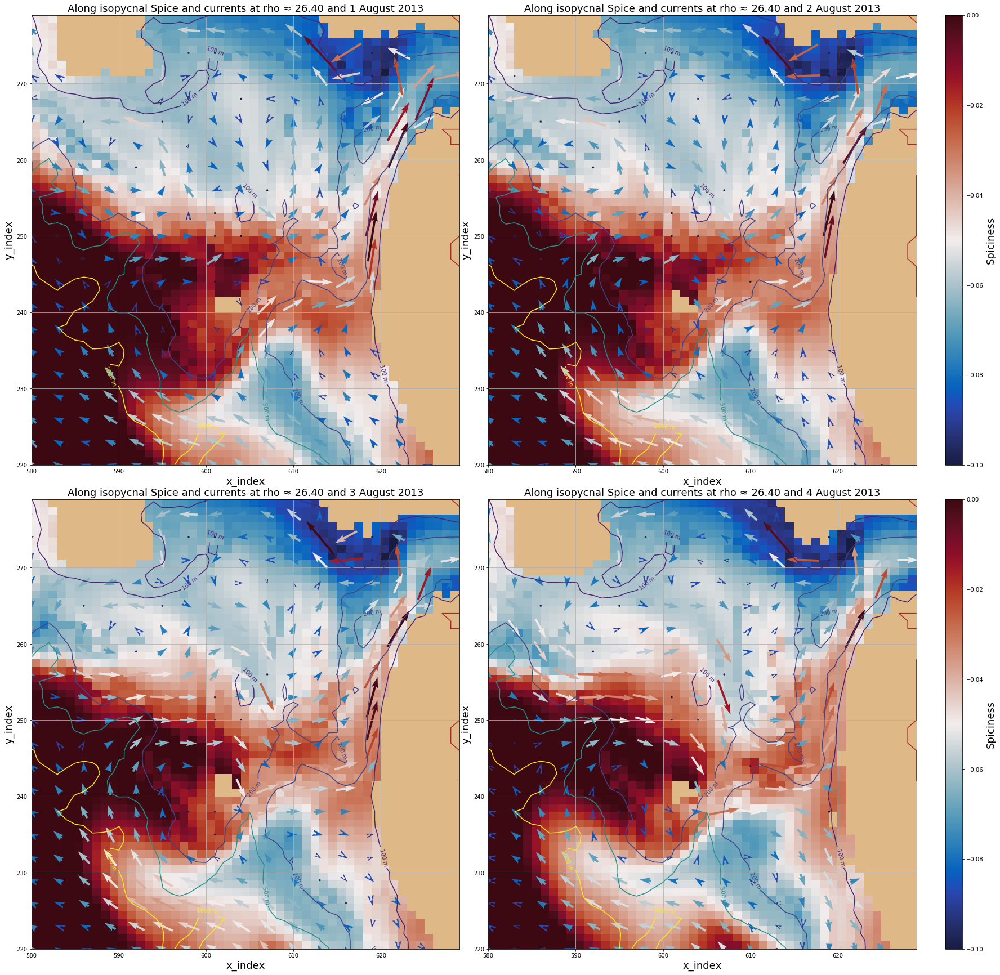

In [90]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =95, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =96, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =97, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =98, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


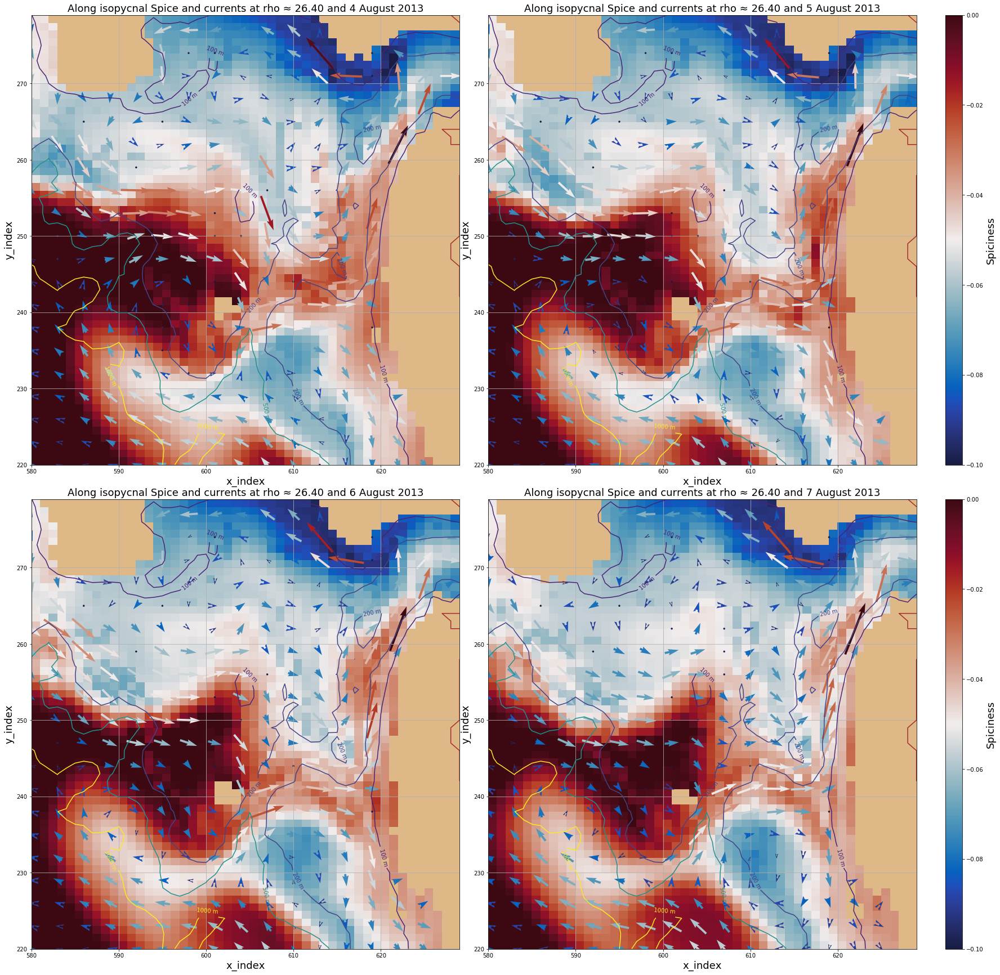

In [91]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =98, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =99, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =100, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =101, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


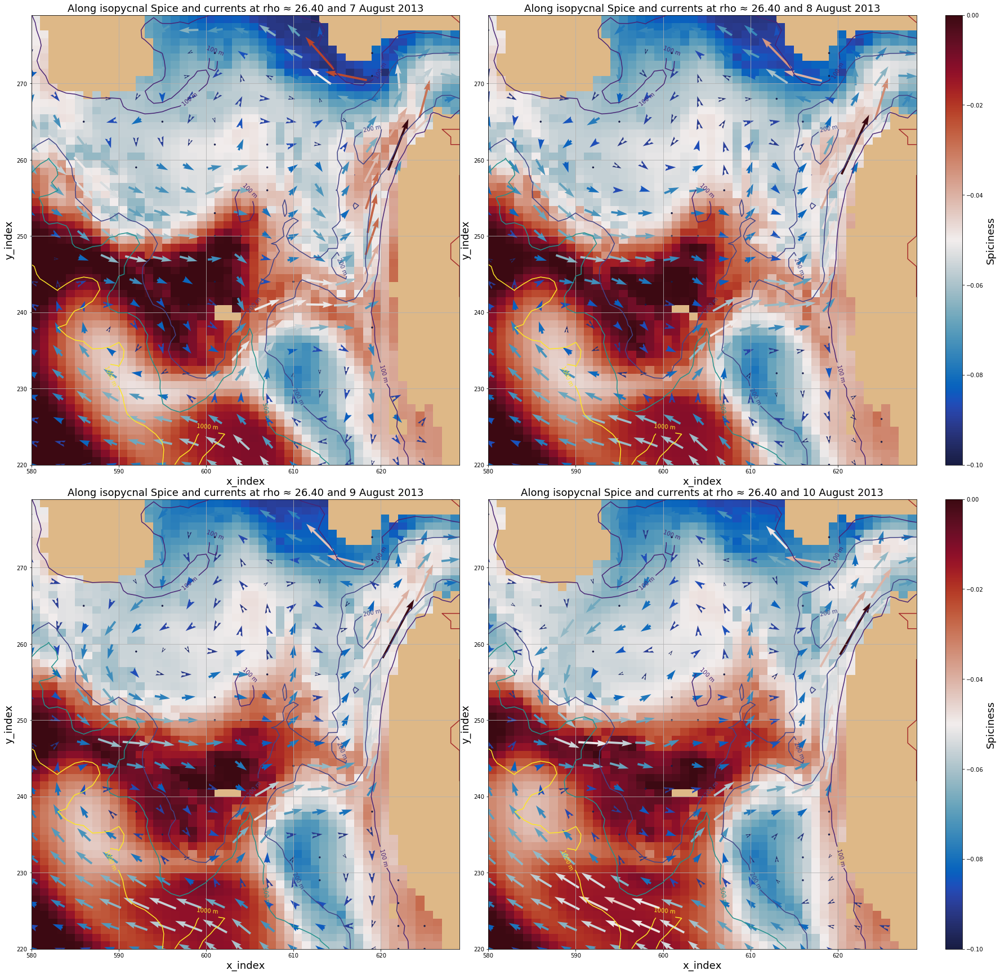

In [92]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =101, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =102, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =103, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =104, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

# Mid August

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


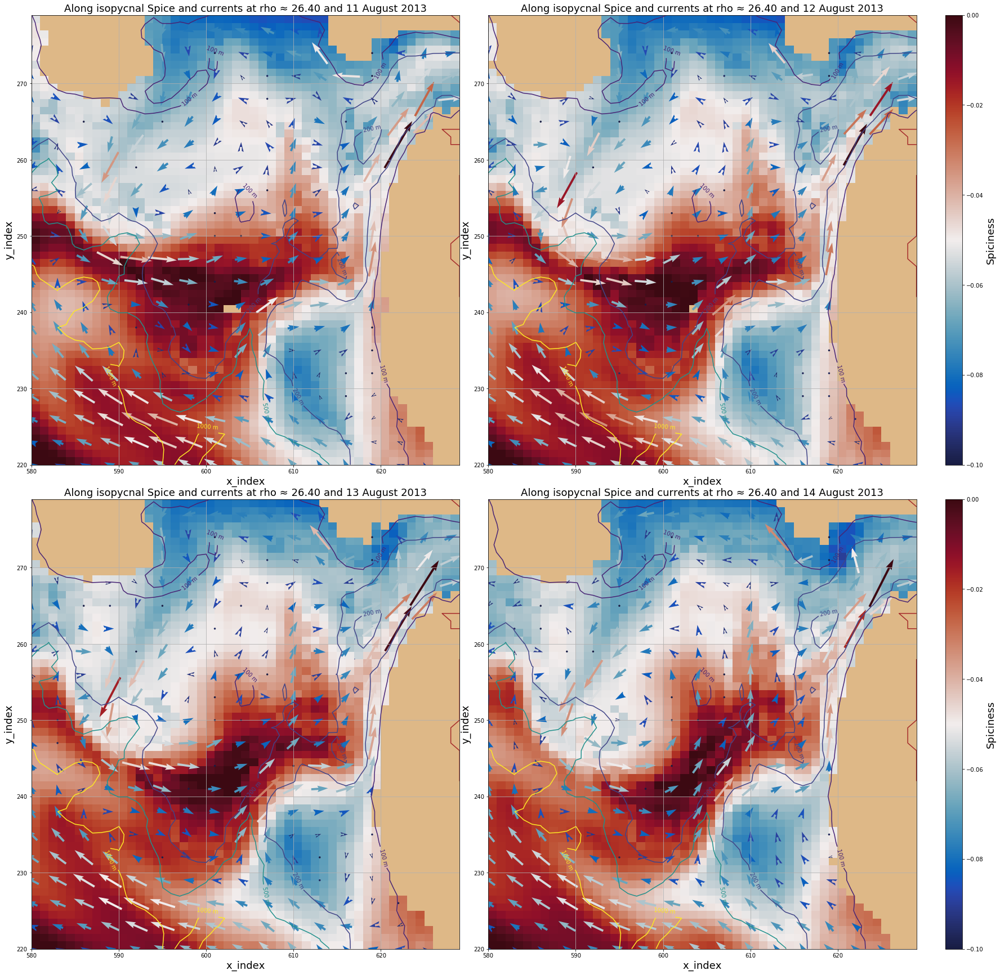

In [93]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =105, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =106, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =107, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =108, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


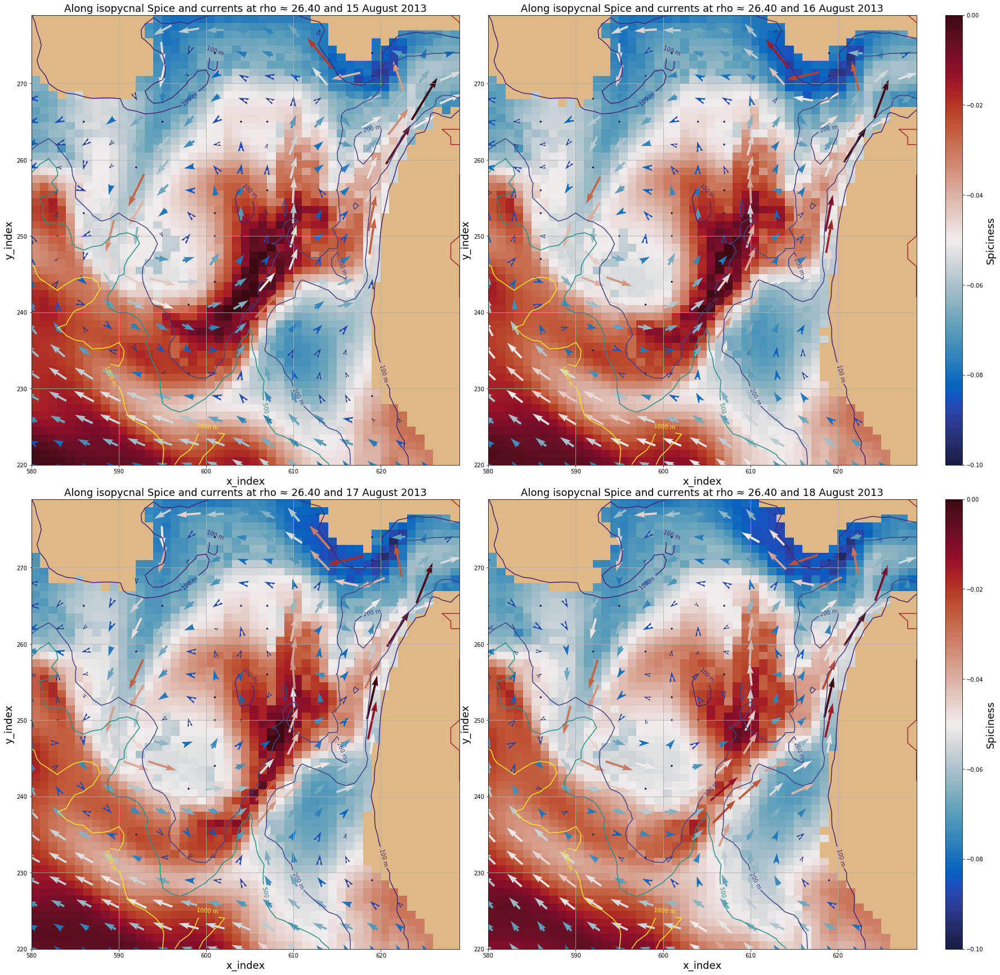

In [94]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =109, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =110, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =111, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =112, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


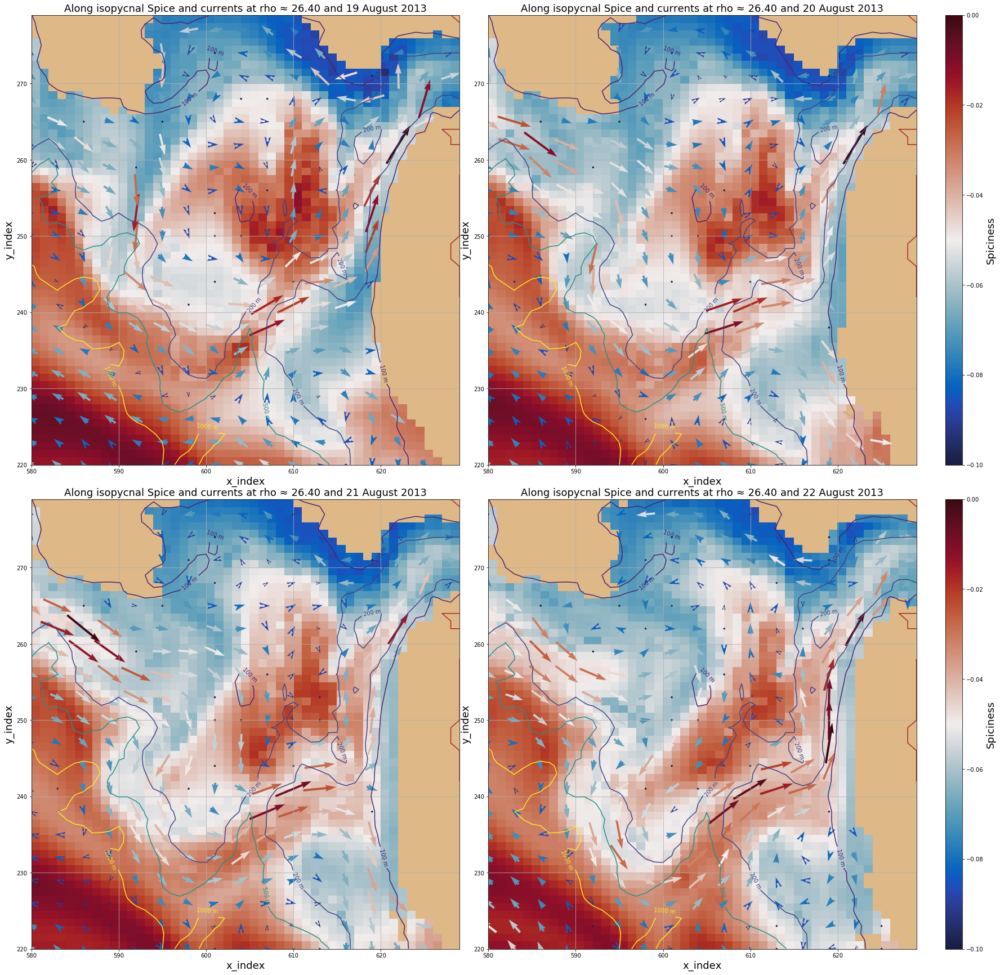

In [96]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =113, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =114, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =115, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =116, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

In [70]:
# End of August

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


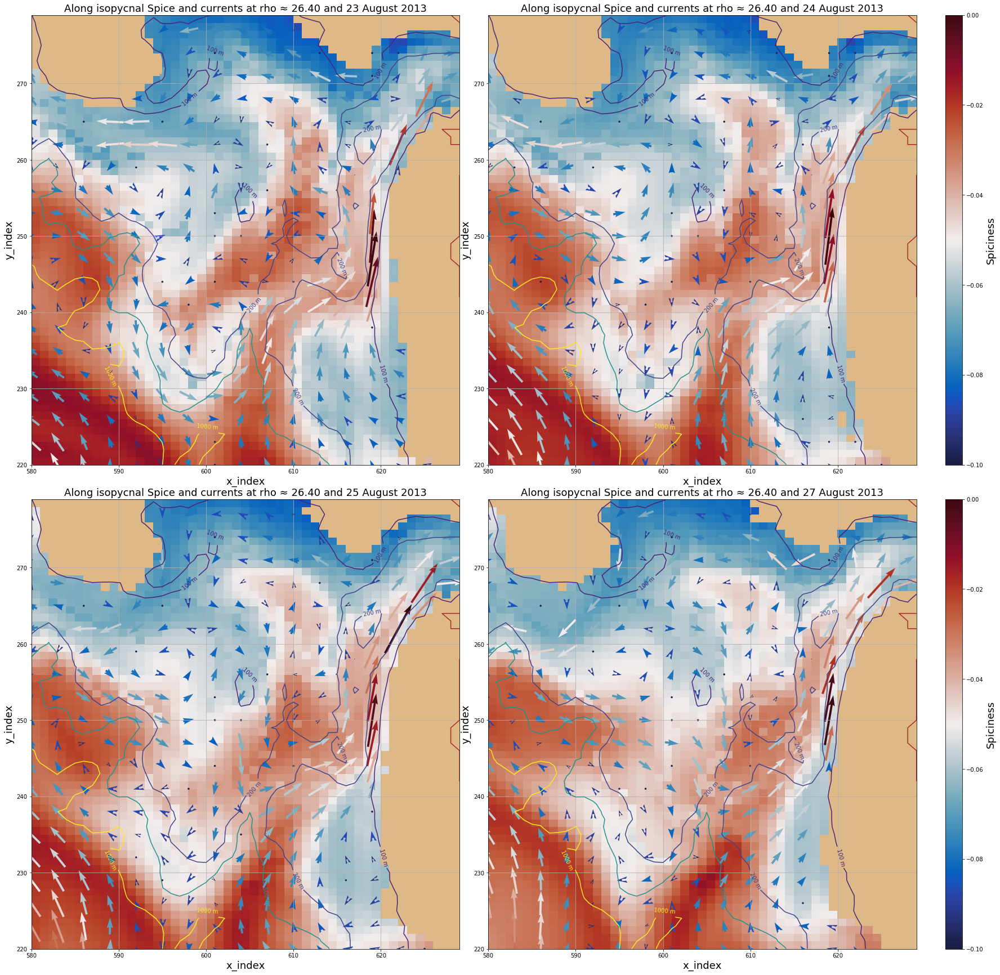

In [100]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =117, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =118, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =119, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =121, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


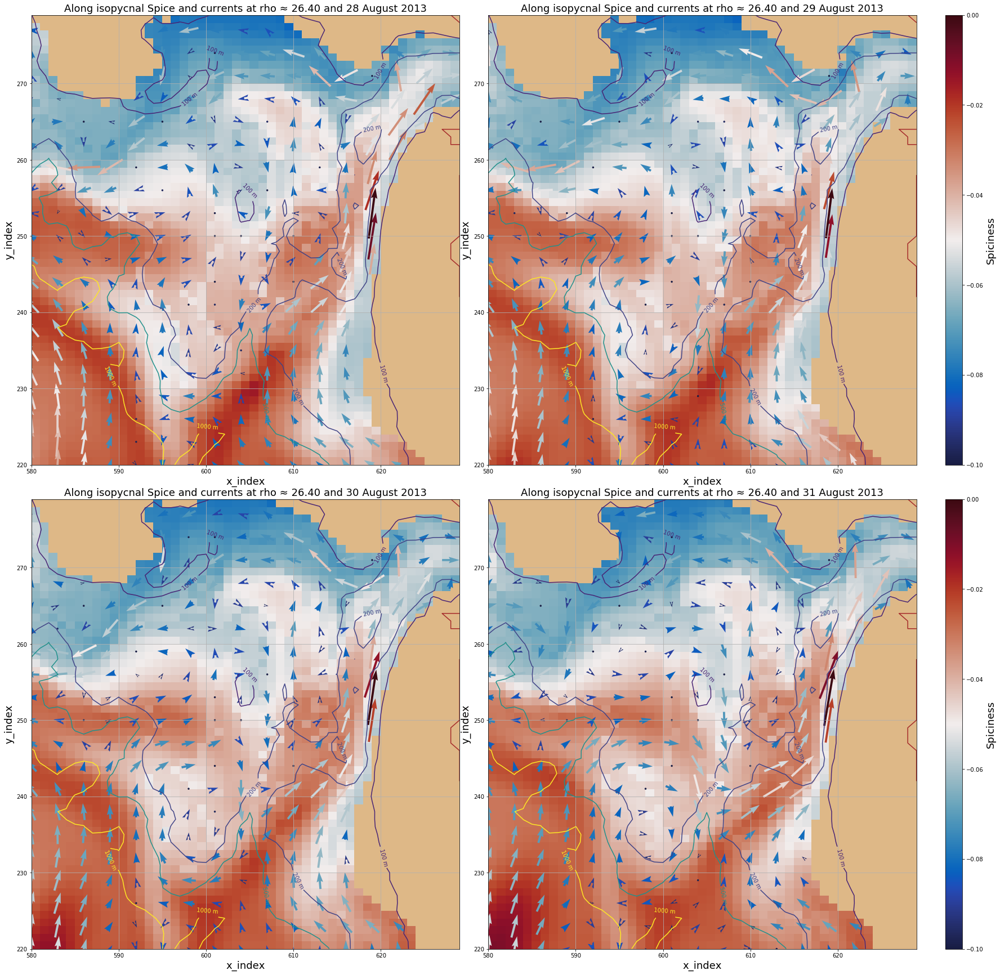

In [98]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=6, w_pad=2, h_pad=4)

axs[0,0], mesh = plot_iso_spice_currents_shorter_subplot(t =122, iso_level=4, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_iso_spice_currents_shorter_subplot(t =123, iso_level=4, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_iso_spice_currents_shorter_subplot(t =124, iso_level=4, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_iso_spice_currents_shorter_subplot(t =125, iso_level=4, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

In [233]:
def plot_iso_spice_currents_shorter(t,iso_level, cmin, cmax):  
    
    arrow_step = 3
    
    y_wcvi_slice = np.array(np.arange(180,300))
    x_wcvi_slice = np.array(np.arange(560,650))
    

    
#     u_falk = u_vel[t1:t2,:,:121, 80:]
#     u_mean = np.mean(u_falk, axis=0)
#     v_falk = v_vel[t1:t2,:, :121, 80:]
#     v_mean = np.mean(v_falk, axis=0)

#     rho_falk = rho[t1:t2,:,:121, 80:]
#     rho_mean = np.mean(rho_falk, axis=0)

    
    u_falk = u_vel[t,:,:120, 80:]
    v_falk = v_vel[t,:, :120, 80:]
    rho_falk = rho[t,:,:120, 80:]





    rho_0 = isot[iso_level]
    
    iso_short = iso_spic[:,:,:120, 80:]

    u_rho_0 = np.zeros_like(iso_short[0,0,...])
    v_rho_0 = np.zeros_like(u_rho_0)


    u_tzyx = np.empty((zlevels.shape[0],y_wcvi_slice.shape[0]-1,x_wcvi_slice.shape[0]))
    v_tzyx = np.empty_like(u_tzyx)



    for level in np.arange(zlevels.shape[0]):
        u_tzyx[level,...], v_tzyx[level,...] = viz_tools.unstagger(u_falk[level,...], v_falk[level,...])
        


    for j in np.arange(u_tzyx.shape[1]):
        for i in np.arange(u_tzyx.shape[2]):
            if mbathy[j,i] > 0:
                u_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, u_tzyx[:mbathy[j,i], j, i])
                v_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, v_tzyx[:mbathy[j,i], j, i])





    val_iso = iso_short[t,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    
    u_rho_0 = np.ma.masked_array(u_rho_0, val_iso.mask)
    v_rho_0 = np.ma.masked_array(v_rho_0, val_iso.mask)
    
    
#     val_iso = np.mean(val_iso, axis=0)


    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][180:300, 560:650]
    lat = bathy['nav_lat'][180:300, 560:650]

    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')

    fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
#     ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=np.mean(lon)))
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin= cmin, vmax= cmax)
    cbar = fig.colorbar(q, ax=ax)
    

    speeds = np.sqrt(np.square(u_rho_0) + np.square(v_rho_0))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_rho_0[::arrow_step,::arrow_step], v_rho_0[::arrow_step,::arrow_step] , speeds[::arrow_step,::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Along isopycnal Spice and currents at rho \u2248 {d:.2f} and {0} August 2013'.format(t-94,d = isot[iso_level]))

#     viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
#     viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    ax.grid()



VI shelf has steep slope as compared to south of the strait; thus spicy water offshore is found as one travels much shorter distance westwards past the 200m isobath. *** Does this make it easier for the shelf break current to pile up spicy water near the shelf (origin of the pool water) just northwards of the mouth of JDF canyon and downstream side of Nitinat canyon. Cyclonic vorticity observed at the head of Nitinat canyon at mid August and anticyclonic at the start of August (upwelling and downwelling signals ??). Rest of August = Upwelling Winds; mid August = Downwelling relaxation, end of August = Downwelling relaxation Winds***

** Mid August Shelf break flow over VI shelf weakens and the stronger undercurrent upwelling in the JDF and Tully canyon

South of the strait the spicy undercurrent water detaches itself from the slope and reattaches northwards (or not if there is a instability around the Quinault Canyon which traps the undercurrent water) 

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


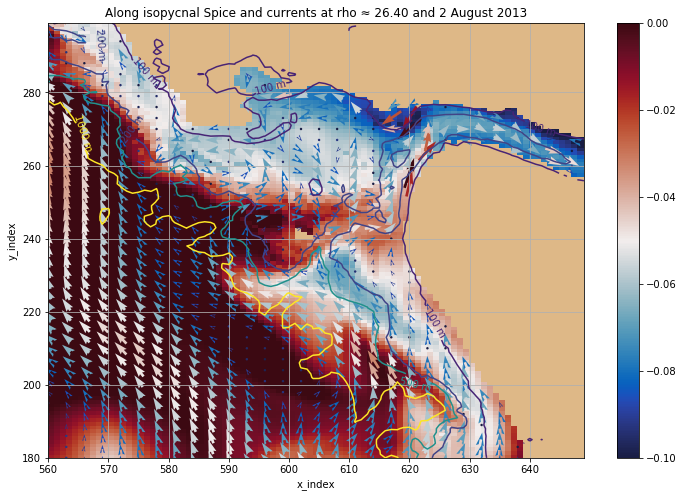

In [116]:
plot_iso_spice_currents_shorter(t = 96,iso_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


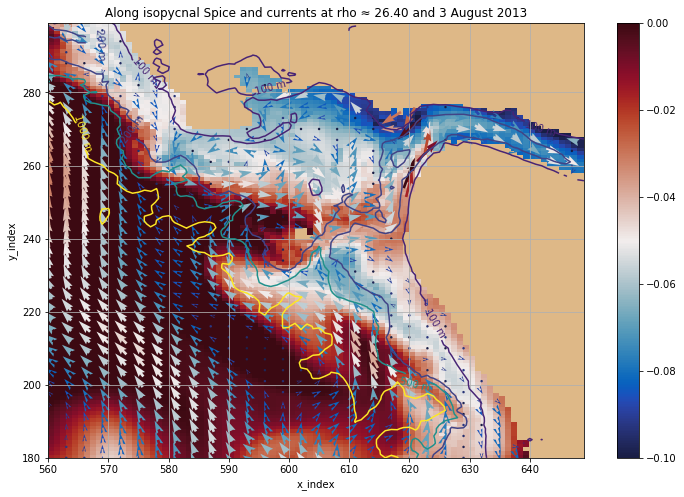

In [117]:
plot_iso_spice_currents_shorter(t = 97,iso_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


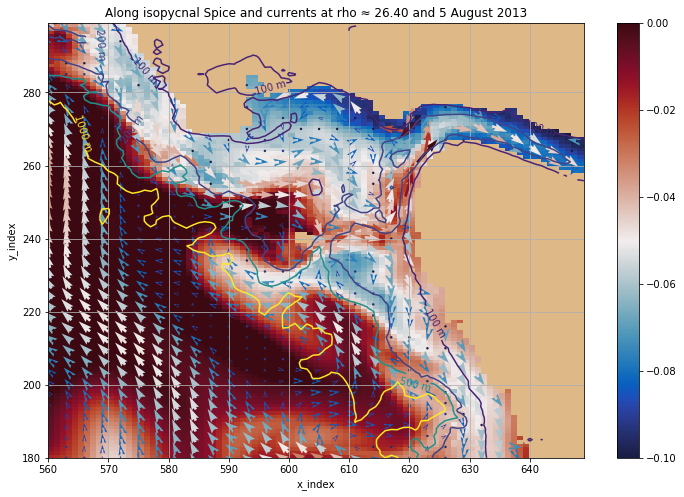

In [118]:
plot_iso_spice_currents_shorter(t = 99,iso_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


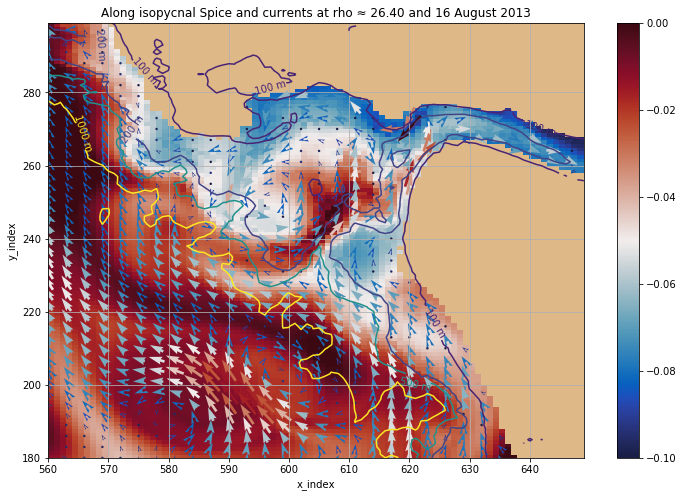

In [119]:
plot_iso_spice_currents_shorter(t = 110,iso_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


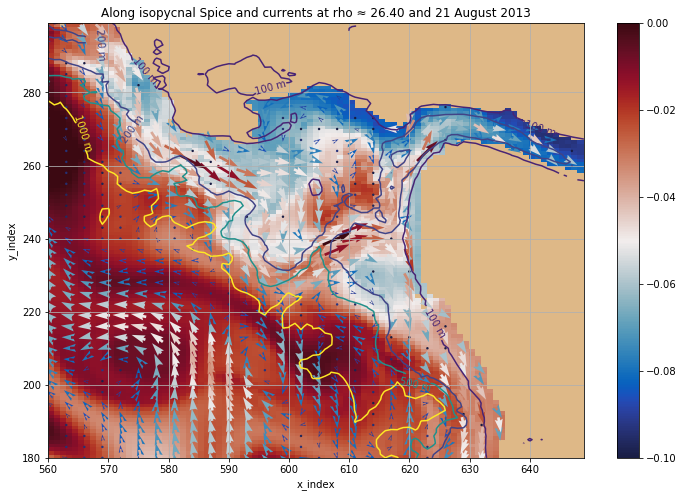

In [120]:
plot_iso_spice_currents_shorter(t = 115,iso_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


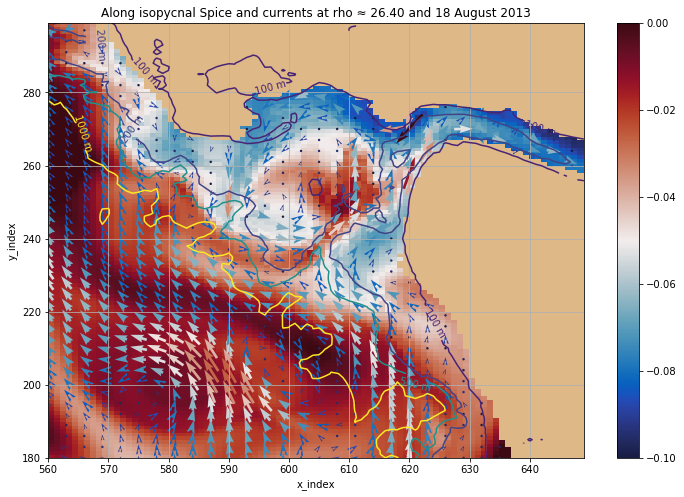

In [121]:
plot_iso_spice_currents_shorter(t = 112,iso_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


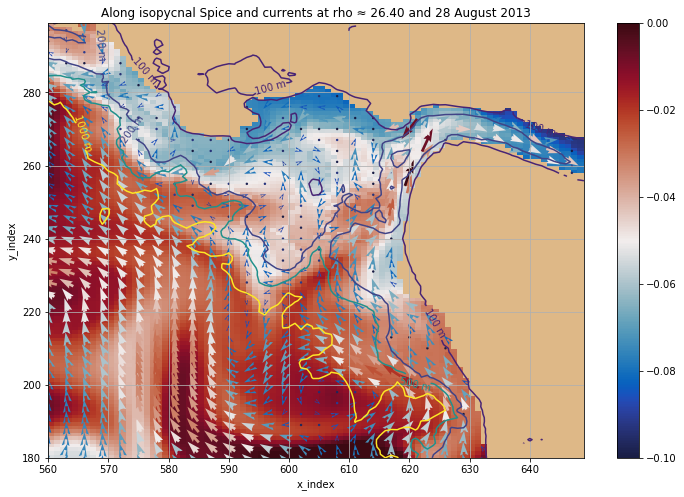

In [122]:
plot_iso_spice_currents_shorter(t = 122,iso_level=4)

In [194]:
bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon']#[220:280, 580:630]
lat = bathy['nav_lat']#[220:280, 580:630]

In [49]:
def plot_iso_spice_currents_shorter_mvp_survey(mat_file_str, t,iso_level, cmin, cmax):  
    
    mat = scipy.io.loadmat(mat_file_str)
    
    depths_survey = mat['depths'][:,0]
    lat_survey = mat['latitude'][:,0]
    lon_survey = mat['longitude'][:,0] - 100
    # den_survey = mat['density'][:]
    pden_survey = mat['pden'][:]
    temp_survey = mat['temp'][:]
    sal_survey = mat['salinity'][:]
    mtime = mat['mtime'][:,0]
    
    pressure_survey = np.empty_like(temp_survey)
    SA_survey = np.empty_like(temp_survey)
    CT_survey = np.empty_like(temp_survey)
    spic_survey = np.empty_like(temp_survey)
    rho_survey = np.empty_like(temp_survey)
    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    mbathy = mask.variables['mbathy'][0,220:280, 575:630]
    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon']
    lat = bathy['nav_lat']


    for j in np.arange(depths_survey.shape[0]):

        for i in np.arange(lat_survey.shape[0]):

            pressure_survey[j,i] = gsw.p_from_z(-depths_survey[j],lat_survey[i])

            SA_survey[j,i] = gsw.SA_from_SP(sal_survey[j,i], pressure_survey[j,i], lon_survey[i], lat_survey[i])

            CT_survey[j,i] = gsw.CT_from_pt(sal_survey[j,i], temp_survey[j,i])

            spic_survey[j,i] = gsw.spiciness0(SA_survey[j,i], CT_survey[j,i])

            rho_survey[j,i] = gsw.density.rho(SA_survey[j,i], CT_survey[j,i], 0)

            #Values indicate that pden is the true representative of the potential density calculated by rho_survey here

    
    y = np.empty_like(lat_survey)
    x = np.empty_like(y)


    for i in np.arange(lat_survey.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_survey[i],lat_survey[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        

    rho_0 = isot[iso_level]

    spic_rho = np.empty((spic_survey.shape[1]))


    for i in np.arange(spic_survey.shape[1]):

        spic_loc = spic_survey[:,i]
        rho_loc  = rho_survey[:,i]

    #     if np.isfinite(spic_loc[i]):
        spic_rho[i] = np.interp(rho_0, rho_loc[:]-1000, spic_loc[:])

    spic_rho_finite = spic_rho[~np.isnan(spic_rho)]

#     spic_rho_finite = np.around(spic_rho_finite,decimals=3)

    y = y[~np.isnan(spic_rho)]
    x = x[~np.isnan(spic_rho)]
    
    




    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)
    
    arrow_step = 3
    
    y_wcvi_slice = np.array(np.arange(220,280))
    x_wcvi_slice = np.array(np.arange(575,630))
    

    
#     u_falk = u_vel[t1:t2,:,:121, 80:]
#     u_mean = np.mean(u_falk, axis=0)
#     v_falk = v_vel[t1:t2,:, :121, 80:]
#     v_mean = np.mean(v_falk, axis=0)

#     rho_falk = rho[t1:t2,:,:121, 80:]
#     rho_mean = np.mean(rho_falk, axis=0)

    
    u_falk = u_vel[t,:,40:100, 95:150]
    v_falk = v_vel[t,:, 40:100, 95:150]
    rho_falk = rho[t,:,40:100, 95:150]





    rho_0 = isot[iso_level]
    
    iso_short = iso_spic[:,:,40:100, 95:150]

    u_rho_0 = np.zeros_like(iso_short[0,0,...])
    v_rho_0 = np.zeros_like(u_rho_0)


    u_tzyx = np.empty((zlevels.shape[0],y_wcvi_slice.shape[0]-1,x_wcvi_slice.shape[0]-1))
    v_tzyx = np.empty_like(u_tzyx)



    for level in np.arange(zlevels.shape[0]):
        u_tzyx[level,...], v_tzyx[level,...] = viz_tools.unstagger(u_falk[level,...], v_falk[level,...])
        


    for j in np.arange(u_tzyx.shape[1]):
        for i in np.arange(u_tzyx.shape[2]):
            if mbathy[j,i] > 0:
                u_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, u_tzyx[:mbathy[j,i], j, i])
                v_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, v_tzyx[:mbathy[j,i], j, i])





    val_iso = iso_short[t,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    
    u_rho_0 = np.ma.masked_array(u_rho_0, val_iso.mask)
    v_rho_0 = np.ma.masked_array(v_rho_0, val_iso.mask)
    
    
#     val_iso = np.mean(val_iso, axis=0)


    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')

    fig, ax = plt.subplots(1, 1, figsize=(20,16)); ax.grid()
#     ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=np.mean(lon)))
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 50, 100, 200, 500, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin= cmin, vmax= cmax)
    cbar = fig.colorbar(q, ax=ax)
    
    

    for i in np.arange(x.shape[0]):

        ax.scatter(x[i], y[i], c = spic_rho_finite[i], norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=200, alpha=0.5, edgecolor= 'cyan' )
    

    speeds = np.sqrt(np.square(u_rho_0) + np.square(v_rho_0))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_rho_0[::arrow_step,::arrow_step], v_rho_0[::arrow_step,::arrow_step] , speeds[::arrow_step,::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Spice and currents at rho \u2248 {d:.2f} and {0} August 2013 (Survey G)'.format(t-94,d = isot[iso_level]))

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    ax.grid()



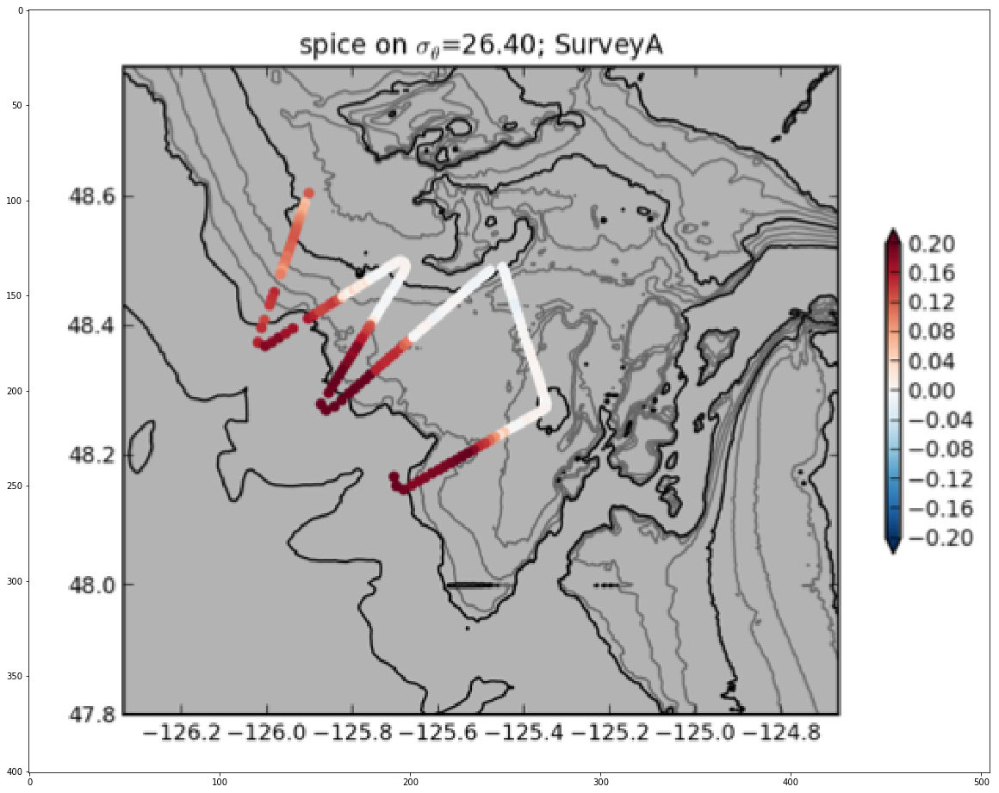

In [33]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/SurveyA.png')



figure, ax = plt.subplots(1, 1, figsize=(20,20));

plt.imshow(img1)
plt.show()

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


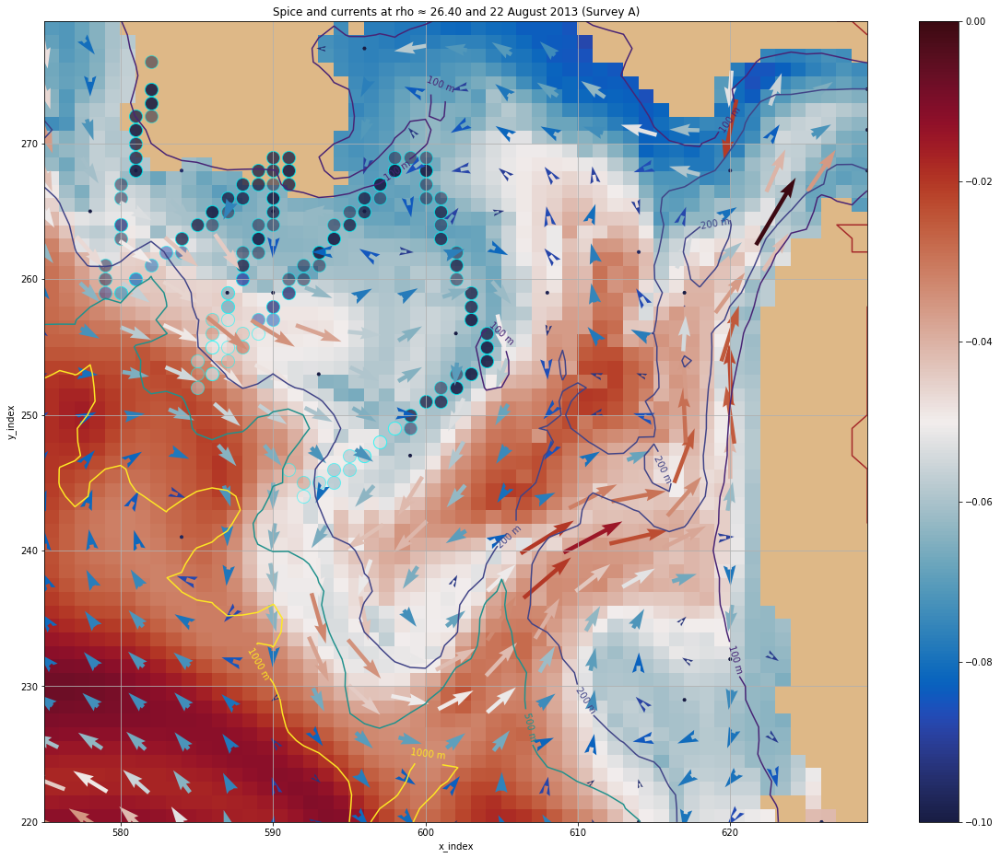

In [32]:
plot_iso_spice_currents_shorter_mvp_survey(t =116, mat_file_str='/data/ssahu/Falkor_2013/mvp/surveyA.mat',cmin=-0.1, cmax=0,iso_level=4)

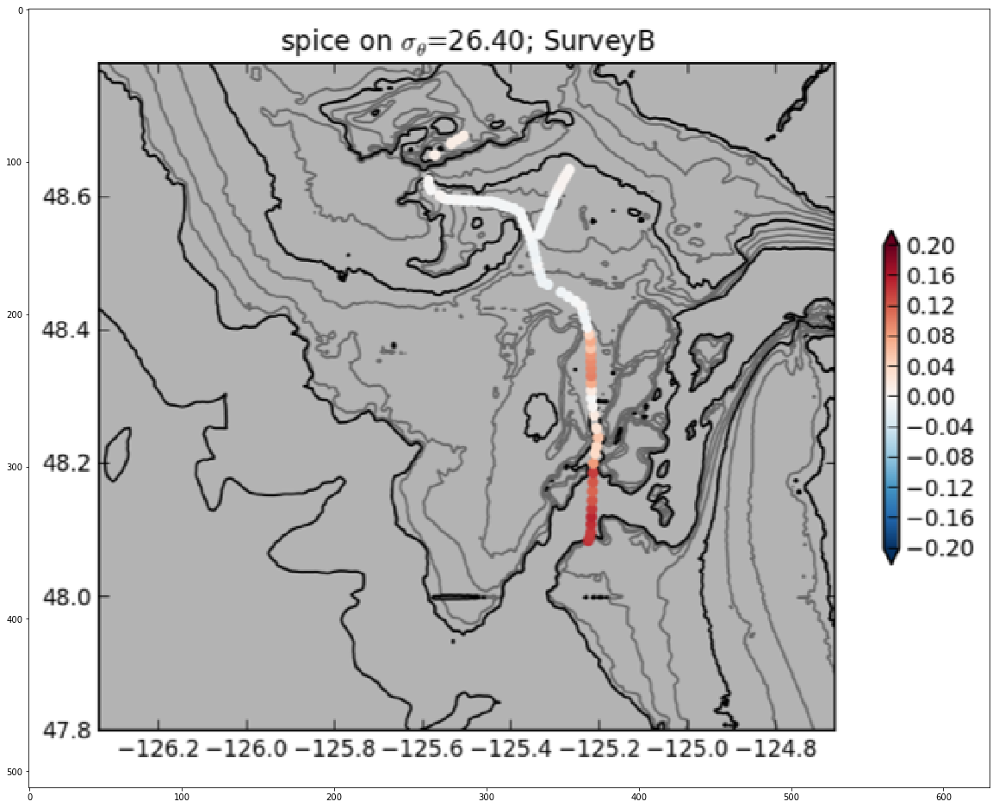

In [36]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/SurveyB.png')



figure, ax = plt.subplots(1, 1, figsize=(20,20));

plt.imshow(img1)
plt.show()

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


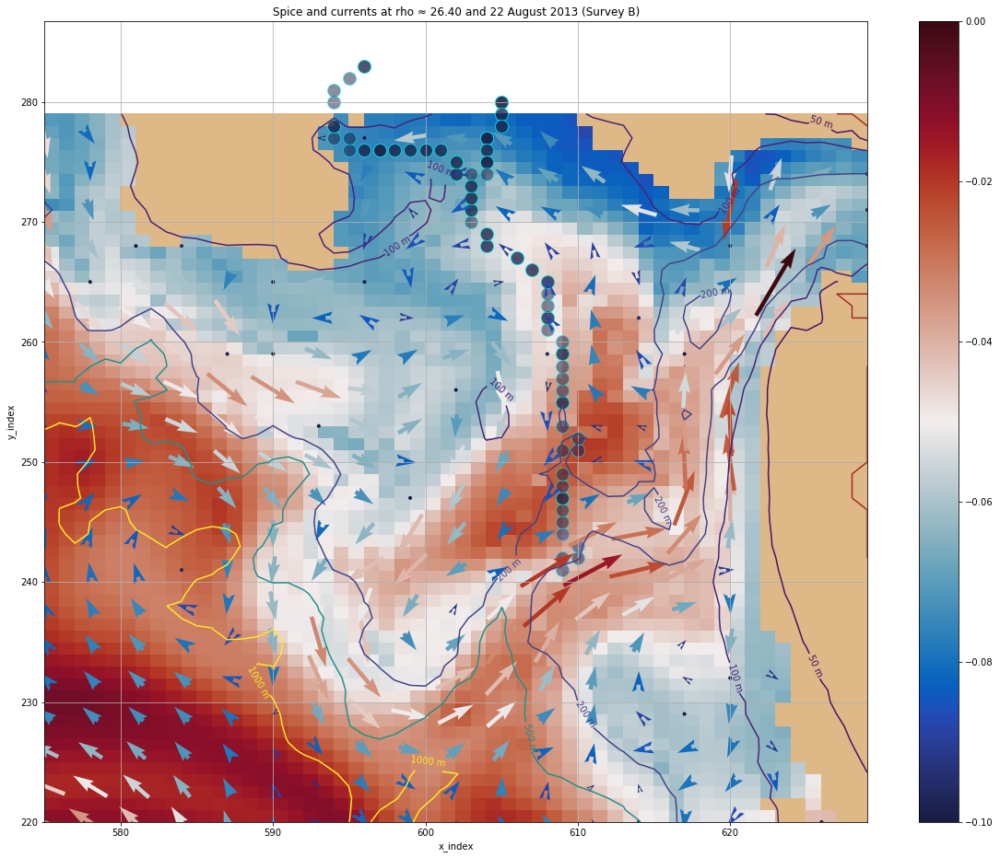

In [38]:
plot_iso_spice_currents_shorter_mvp_survey(t =116, mat_file_str='/data/ssahu/Falkor_2013/mvp/surveyB.mat',cmin=-0.1, cmax=0,iso_level=4)

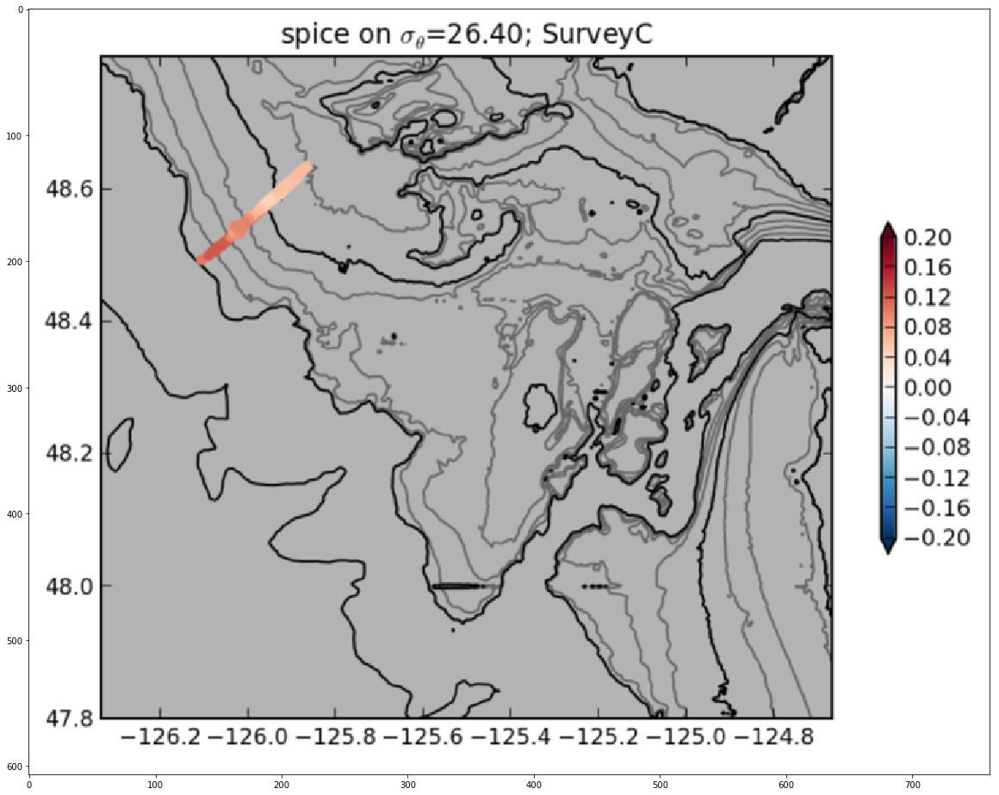

In [39]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/SurveyC.png')



figure, ax = plt.subplots(1, 1, figsize=(20,20));

plt.imshow(img1)
plt.show()

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


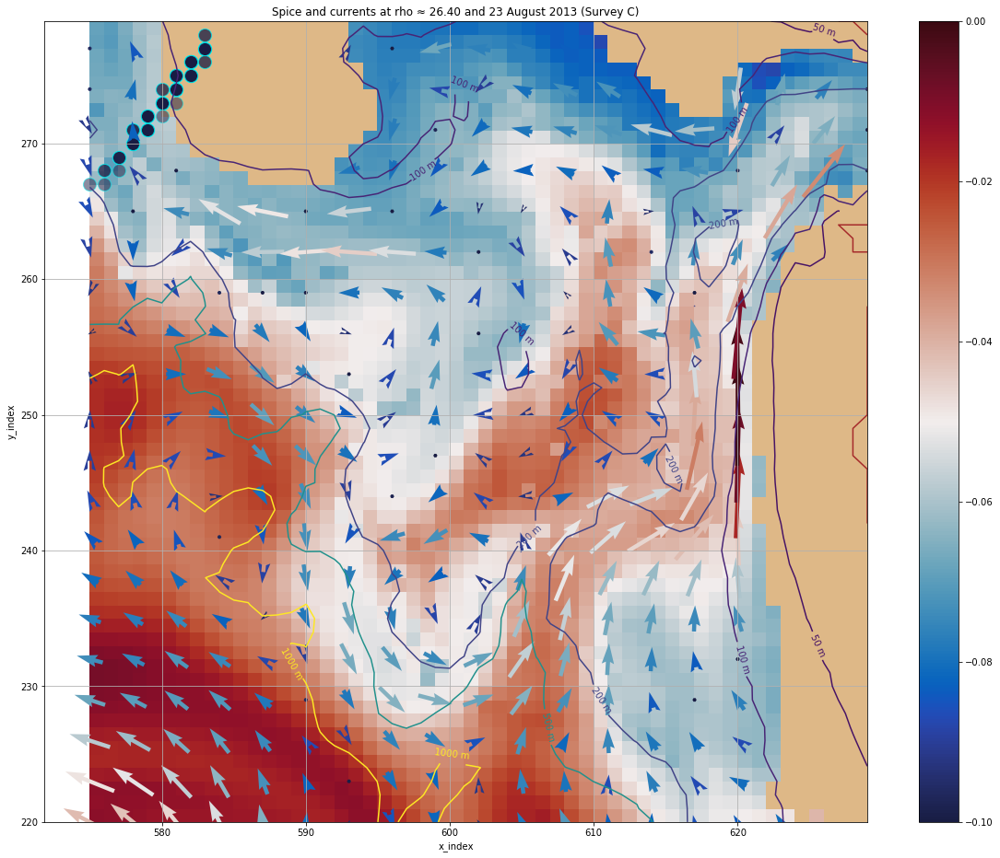

In [41]:
plot_iso_spice_currents_shorter_mvp_survey(t =117, mat_file_str='/data/ssahu/Falkor_2013/mvp/surveyC.mat',cmin=-0.1, cmax=0,iso_level=4)

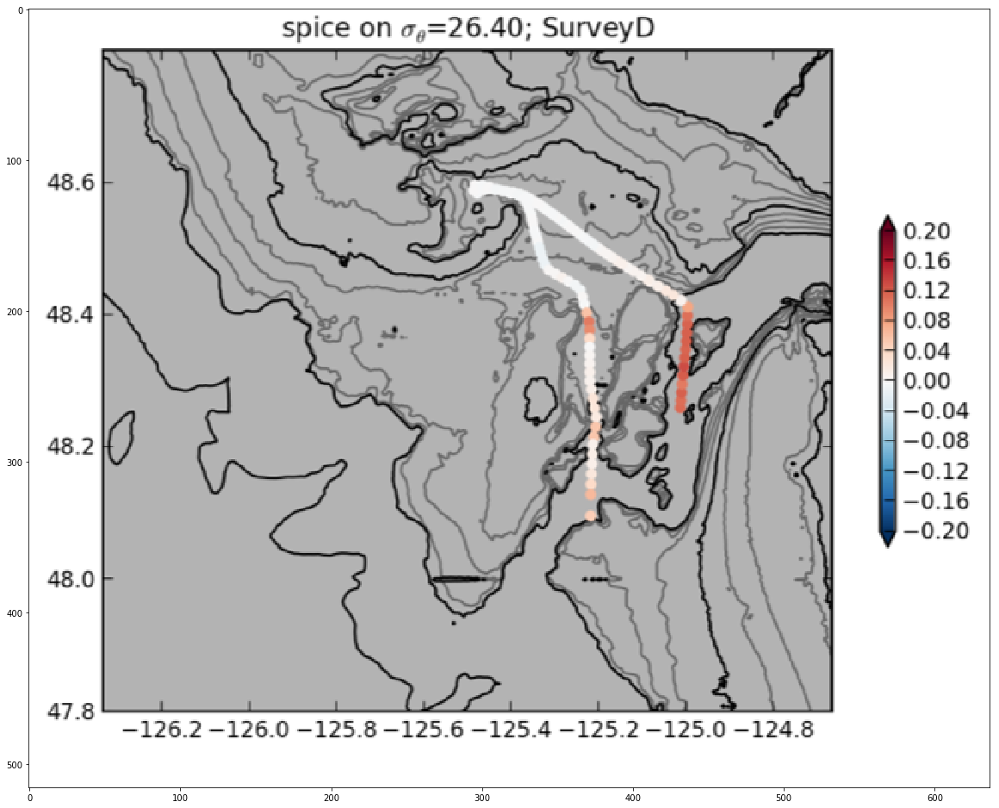

In [44]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/SurveyD.png')



figure, ax = plt.subplots(1, 1, figsize=(20,20));

plt.imshow(img1)
plt.show()

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


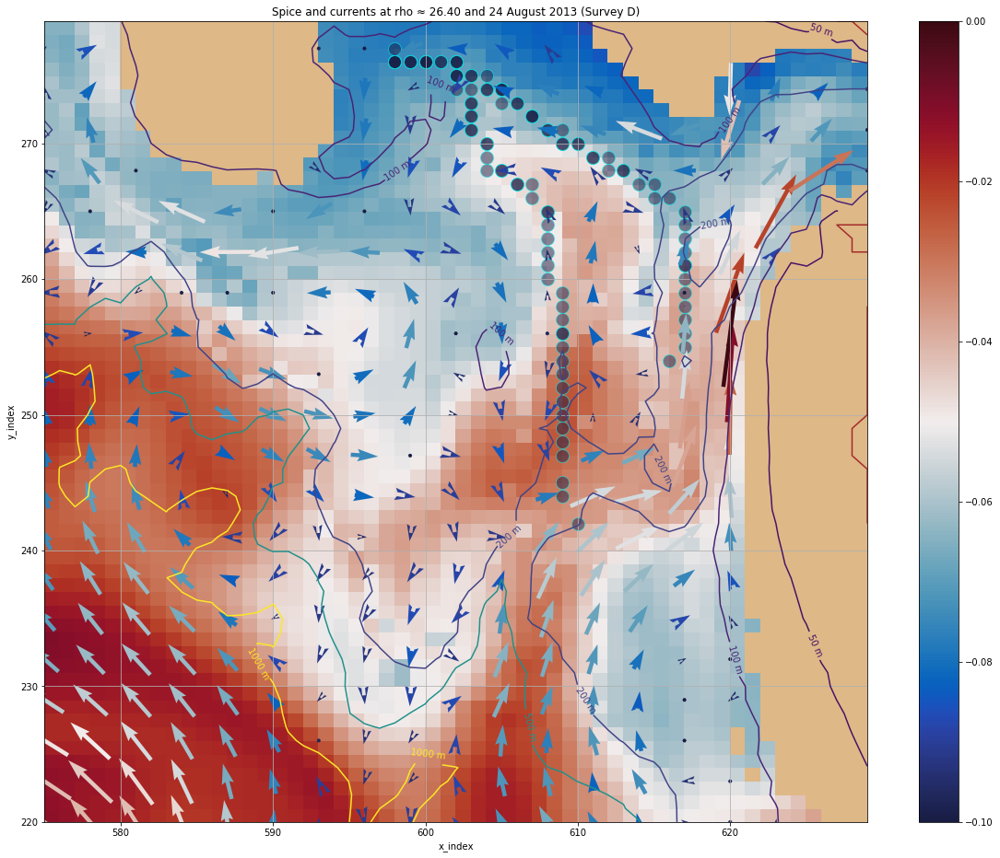

In [43]:
plot_iso_spice_currents_shorter_mvp_survey(t =118, mat_file_str='/data/ssahu/Falkor_2013/mvp/surveyD.mat',cmin=-0.1, cmax=0,iso_level=4)

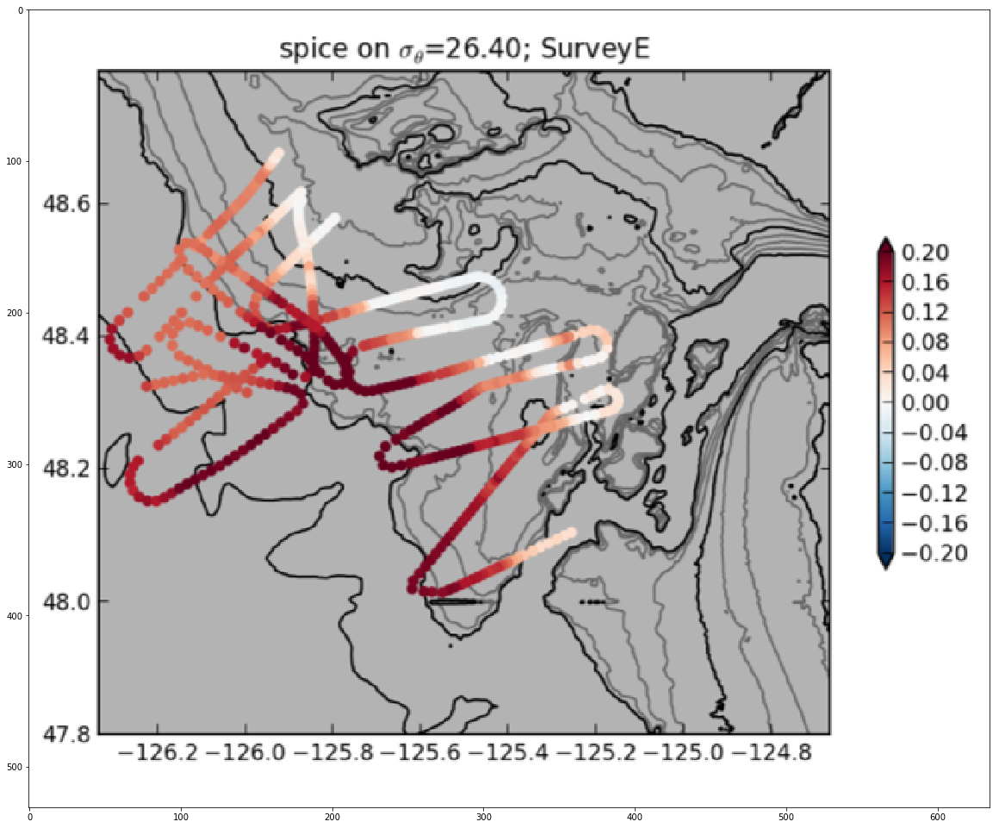

In [45]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/SurveyE.png')



figure, ax = plt.subplots(1, 1, figsize=(20,20));

plt.imshow(img1)
plt.show()

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


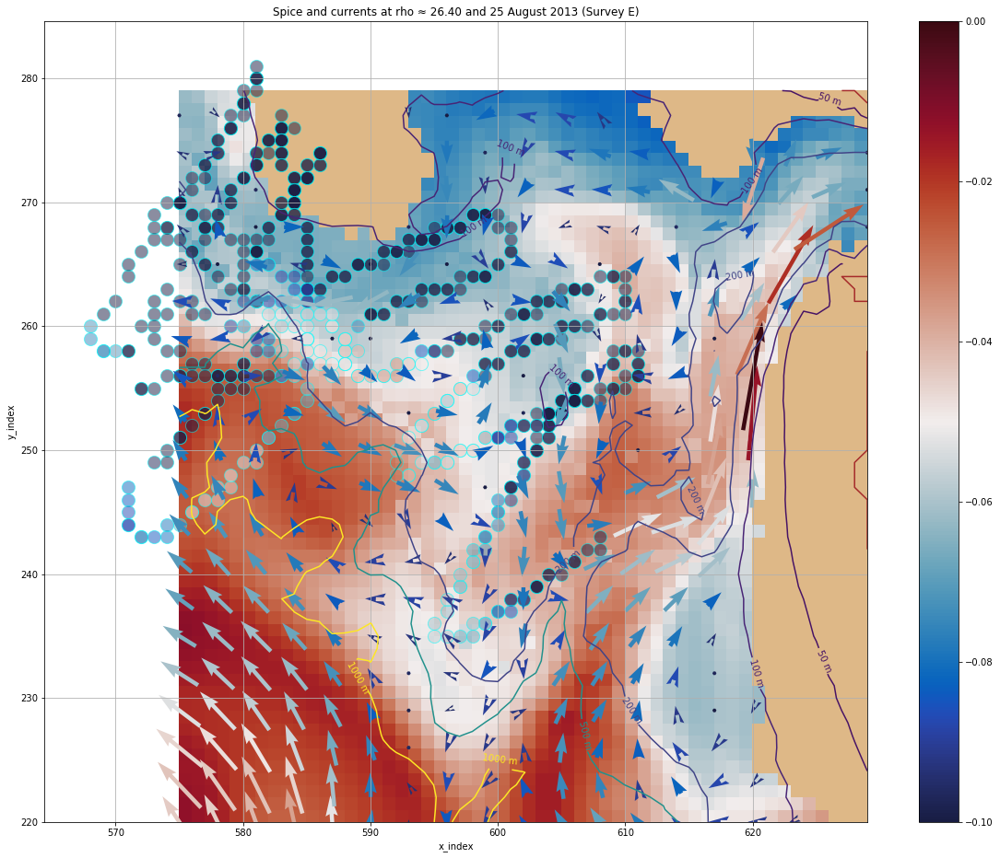

In [47]:
plot_iso_spice_currents_shorter_mvp_survey(t =119, mat_file_str='/data/ssahu/Falkor_2013/mvp/surveyE.mat',cmin=-0.1, cmax=0,iso_level=4)

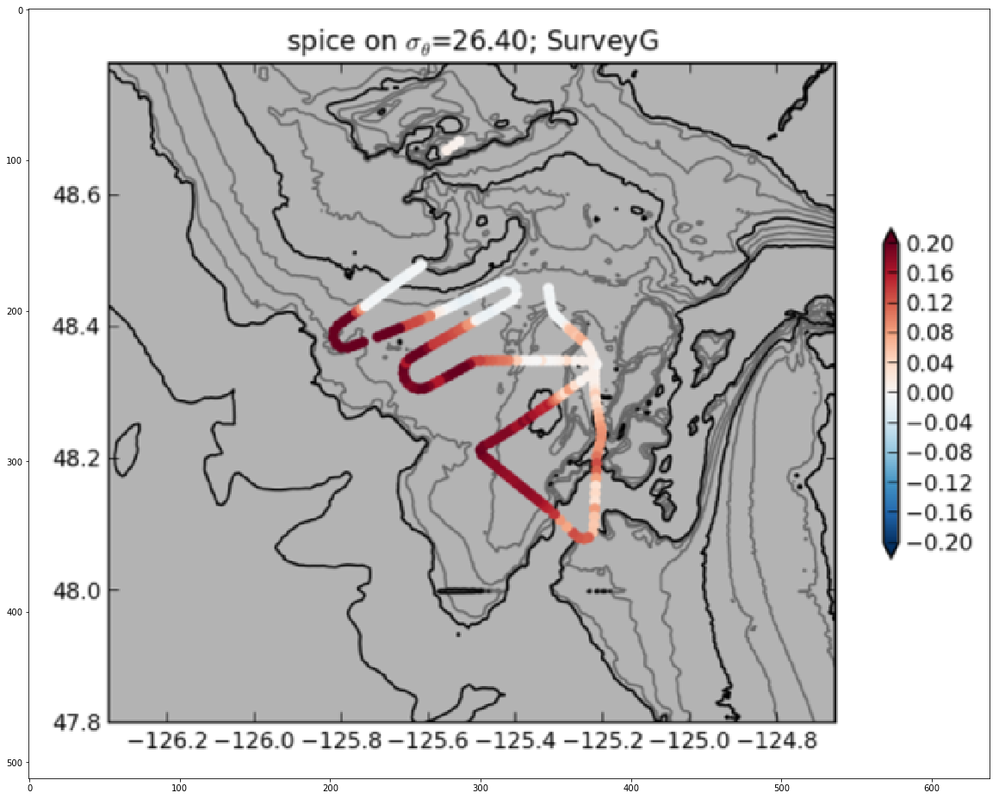

In [48]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/SurveyG.png')



figure, ax = plt.subplots(1, 1, figsize=(20,20));

plt.imshow(img1)
plt.show()

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


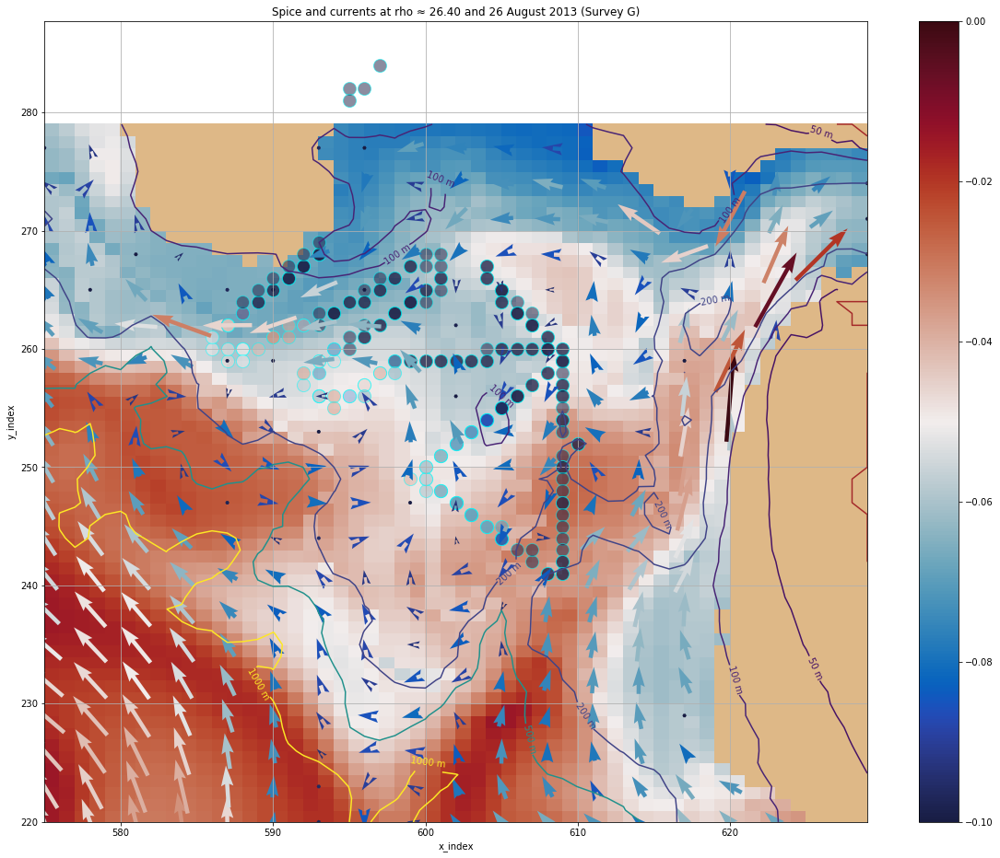

In [50]:
plot_iso_spice_currents_shorter_mvp_survey(t =120, mat_file_str='/data/ssahu/Falkor_2013/mvp/surveyG.mat',cmin=-0.1, cmax=0,iso_level=4)

In [95]:
# Load MATLAB file: mat
mat = scipy.io.loadmat('/data/ssahu/Falkor_2013/mvp/surveyA.mat')

In [96]:
mat.keys()

dict_keys(['__header__', 'analog', 'depths', 'matlabtime', 'pden', 'temp', 'mtime', 'salinity', 'latitude', '__globals__', 'cond', 'density', 'longitude', 'cast_number', 'pressure', '__version__', 'bottom'])

In [115]:
depths_survey = mat['depths'][:,0]
lat_survey = mat['latitude'][:,0]
lon_survey = mat['longitude'][:,0] - 100
# den_survey = mat['density'][:]
pden_survey = mat['pden'][:]
temp_survey = mat['temp'][:]
sal_survey = mat['salinity'][:]
mtime = mat['mtime'][:,0]

In [116]:
import gsw

In [125]:
pressure_survey = np.empty_like(temp_survey)
SA_survey = np.empty_like(temp_survey)
CT_survey = np.empty_like(temp_survey)
spic_survey = np.empty_like(temp_survey)
rho_survey = np.empty_like(temp_survey)

    
for j in np.arange(depths_survey.shape[0]):
    
    for i in np.arange(lat_survey.shape[0]):

        pressure_survey[j,i] = gsw.p_from_z(-depths_survey[j],lat_survey[i])

        SA_survey[j,i] = gsw.SA_from_SP(sal_survey[j,i], pressure_survey[j,i], lon_survey[i], lat_survey[i])

        CT_survey[j,i] = gsw.CT_from_pt(sal_survey[j,i], temp_survey[j,i])

        spic_survey[j,i] = gsw.spiciness0(SA_survey[j,i], CT_survey[j,i])
        
        rho_survey[j,i] = gsw.density.rho(SA_survey[j,i], CT_survey[j,i], 0)
        
        #Values indicate that pden is the true representative of the potential density calculated by rho_survey here

In [196]:
iso_level = 4

rho_0 = isot[iso_level]

spic_rho = np.empty((spic_survey.shape[1]))


for i in np.arange(spic_survey.shape[1]):
    
    spic_loc = spic_survey[:,i]
    rho_loc  = rho_survey[:,i]

#     if np.isfinite(spic_loc[i]):
    spic_rho[i] = np.interp(rho_0, rho_loc[:]-1000, spic_loc[:])

spic_rho_finite = spic_rho[~np.isnan(spic_rho)]

spic_rho_finite = np.around(spic_rho_finite,decimals=3)

y = y[~np.isnan(spic_rho)]
x = x[~np.isnan(spic_rho)]



In [183]:
spic_rho_finite.shape

(195,)

In [184]:
y.shape

(195,)

In [169]:
depths_survey.shape

(251,)

In [174]:
np.nanmean(rho_survey)

1026.0027659882892

In [124]:
np.nanmax(rho_survey - pden_survey)

0.0060404872521075959

In [195]:
y = np.empty_like(lat_survey)
x = np.empty_like(y)


for i in np.arange(lat_survey.shape[0]):
    y[i], x[i] = geo_tools.find_closest_model_point(
               lon_survey[i],lat_survey[i],lon,lat,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

In [118]:
lat_survey[34]

48.369348383333332

In [76]:
depths.shape

(251,)

In [111]:
lat_survey.shape

(203,)

In [112]:
pden_survey.shape

(251, 203)

In [81]:
np.nanmax(den_survey)

1027.5652667418528

In [83]:
np.nanmax(pden_survey)

1026.6571343144894

In [86]:
mtime[:]

array([ 735101.17479745,  735101.18542245,  735101.19073611,
        735101.19441667,  735101.19910417,  735101.20393056,
        735101.20621065,  735101.20759954,  735101.20897685,
        735101.21034259,  735101.21174306,  735101.21312037,
        735101.21447454,  735101.21590972,  735101.21731019,
        735101.21881481,  735101.22038889,  735101.22204514,
        735101.22381597,  735101.22565625,  735101.2275081 ,
        735101.22946412,  735101.23146644,  735101.23352662,
        735101.23572569,  735101.23798264,  735101.24028588,
        735101.2525787 ,  735101.25550694,  735101.25878241,
        735101.26220833,  735101.26585417,  735101.26947685,
        735101.27613194,  735101.28036806,  735101.28437384,
        735101.28833218,  735101.29241782,  735101.2964919 ,
        735101.30078588,  735101.30505671,  735101.30825116,
        735101.31121412,  735101.3139919 ,  735101.31673495,
        735101.31931713,  735101.32181713,  735101.32414352,
        735101.32569444,

In [61]:
np.nanmax(temp_survey)

16.281500000000005

In [47]:
# Load MATLAB file: mat
mat = scipy.io.loadmat('/data/ssahu/Falkor_2013/mvp/surveyC.mat')

In [48]:
depths_survey = mat['depths'][:,0]
lat_survey = mat['latitude'][:,0]
lon_survey = mat['longitude'][:,0]
den_survey = mat['density'][:,0]
temp_survey = mat['temp'][:,0]
sal_survey = mat['salinity'][:,0]


In [49]:
sal_survey

array([         nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,  31.79189135,  31.87822941,  31.94117696,
        32.07688356,  32.22925641,  32.28496081,  32.30670406,
        32.31456692,  32.36552537,  32.42239491,  32.44867424,
        32.45619164,  32.47533514,  32.50234305,  32.53138571,
        32.56532148,  32.59261523,  32.60825571,  32.60495534,
        32.61232805,  32.62272178,  32.65151517,  32.6762729 ,
        32.69628819,  32.73352727,  32.80277806,  32.83371113,
        32.87186476,  32.90629085,  32.92898556,  32.94479709,
        32.95357016,  32.9628046 ,  32.97272753,  32.97892882,
        32.99115544,  33.01997349,  33.07497604,  33.08069959,
        33.08487045,  33.09079404,  33.09379023,  33.10205759,
        33.11611639,  33.11902412,  33.12432379,  33.13711205,
        33.16356964,  33.17543987,  33.17932617,  33.18242312,
        33.18725437,  33.20474811,  33.24543895,  33.28

In [235]:
mbathy = mask.variables['mbathy'][0,220:280, 575:630]

In [236]:
def plot_iso_spice_currents_shorter_mvp_survey(t,iso_level, cmin, cmax):  
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)
    
    arrow_step = 3
    
    y_wcvi_slice = np.array(np.arange(220,280))
    x_wcvi_slice = np.array(np.arange(575,630))
    

    
#     u_falk = u_vel[t1:t2,:,:121, 80:]
#     u_mean = np.mean(u_falk, axis=0)
#     v_falk = v_vel[t1:t2,:, :121, 80:]
#     v_mean = np.mean(v_falk, axis=0)

#     rho_falk = rho[t1:t2,:,:121, 80:]
#     rho_mean = np.mean(rho_falk, axis=0)

    
    u_falk = u_vel[t,:,40:100, 95:150]
    v_falk = v_vel[t,:, 40:100, 95:150]
    rho_falk = rho[t,:,40:100, 95:150]





    rho_0 = isot[iso_level]
    
    iso_short = iso_spic[:,:,40:100, 95:150]

    u_rho_0 = np.zeros_like(iso_short[0,0,...])
    v_rho_0 = np.zeros_like(u_rho_0)


    u_tzyx = np.empty((zlevels.shape[0],y_wcvi_slice.shape[0]-1,x_wcvi_slice.shape[0]-1))
    v_tzyx = np.empty_like(u_tzyx)



    for level in np.arange(zlevels.shape[0]):
        u_tzyx[level,...], v_tzyx[level,...] = viz_tools.unstagger(u_falk[level,...], v_falk[level,...])
        


    for j in np.arange(u_tzyx.shape[1]):
        for i in np.arange(u_tzyx.shape[2]):
            if mbathy[j,i] > 0:
                u_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, u_tzyx[:mbathy[j,i], j, i])
                v_rho_0[j, i] = np.interp(rho_0, rho_falk[:mbathy[j,i], j, i]-1000, v_tzyx[:mbathy[j,i], j, i])





    val_iso = iso_short[t,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    
    u_rho_0 = np.ma.masked_array(u_rho_0, val_iso.mask)
    v_rho_0 = np.ma.masked_array(v_rho_0, val_iso.mask)
    
    
#     val_iso = np.mean(val_iso, axis=0)


    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][180:300, 575:650]
    lat = bathy['nav_lat'][180:300, 575:650]

    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')

    fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
#     ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=np.mean(lon)))
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin= cmin, vmax= cmax)
    cbar = fig.colorbar(q, ax=ax)
    
    

    for i in np.arange(x.shape[0]):

        ax.scatter(x[i], y[i], c = spic_rho_finite[i], norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=200, alpha=0.5, edgecolor= 'cyan' )
    

    speeds = np.sqrt(np.square(u_rho_0) + np.square(v_rho_0))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_rho_0[::arrow_step,::arrow_step], v_rho_0[::arrow_step,::arrow_step] , speeds[::arrow_step,::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Along isopycnal Spice and currents at rho \u2248 {d:.2f} and {0} August 2013'.format(t-94,d = isot[iso_level]))

#     viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
#     viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    ax.grid()



/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


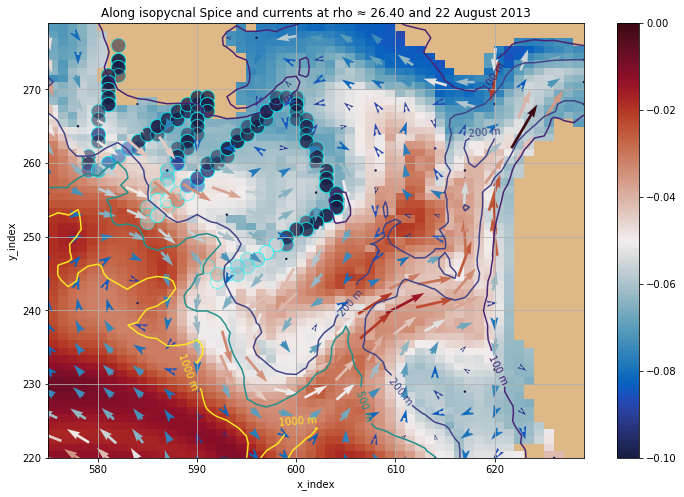

In [239]:
plot_iso_spice_currents_shorter_mvp_survey(t=116, cmin=-0.1, cmax=0, iso_level=4)

In [199]:
rho_0

26.4

In [213]:
np.min(x)

579.0